# 语言翻译

在此项目中，你将了解神经网络机器翻译这一领域。你将用由英语和法语语句组成的数据集，训练一个序列到序列模型（sequence to sequence model），该模型能够将新的英语句子翻译成法语。

## 获取数据

因为将整个英语语言内容翻译成法语需要大量训练时间，所以我们提供了一小部分的英语语料库。


In [1]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper
import problem_unittests as tests

from os.path import isdir
if not isdir('checkpoints'):
    !mkdir checkpoints

source_path = 'data/small_vocab_en'
target_path = 'data/small_vocab_fr'
source_text = helper.load_data(source_path)
target_text = helper.load_data(target_path)

## 探索数据

研究 view_sentence_range，查看并熟悉该数据的不同部分。


In [2]:
view_sentence_range = (0, 10)

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

print('Dataset Stats')
print('Roughly the number of unique words: {}'.format(len({word: None for word in source_text.split()})))

sentences = source_text.split('\n')
word_counts = [len(sentence.split()) for sentence in sentences]
print('Number of sentences: {}'.format(len(sentences)))
print('Average number of words in a sentence: {}'.format(np.average(word_counts)))

print()
print('English sentences {} to {}:'.format(*view_sentence_range))
print('\n'.join(source_text.split('\n')[view_sentence_range[0]:view_sentence_range[1]]))
print()
print('French sentences {} to {}:'.format(*view_sentence_range))
print('\n'.join(target_text.split('\n')[view_sentence_range[0]:view_sentence_range[1]]))

Dataset Stats
Roughly the number of unique words: 227
Number of sentences: 137861
Average number of words in a sentence: 13.225277634719028

English sentences 0 to 10:
new jersey is sometimes quiet during autumn , and it is snowy in april .
the united states is usually chilly during july , and it is usually freezing in november .
california is usually quiet during march , and it is usually hot in june .
the united states is sometimes mild during june , and it is cold in september .
your least liked fruit is the grape , but my least liked is the apple .
his favorite fruit is the orange , but my favorite is the grape .
paris is relaxing during december , but it is usually chilly in july .
new jersey is busy during spring , and it is never hot in march .
our least liked fruit is the lemon , but my least liked is the grape .
the united states is sometimes busy during january , and it is sometimes warm in november .

French sentences 0 to 10:
new jersey est parfois calme pendant l' automne 

## 实现预处理函数

### 文本到单词 id

和之前的 RNN 一样，你必须首先将文本转换为数字，这样计算机才能读懂。在函数 `text_to_ids()` 中，你需要将单词中的 `source_text` 和 `target_text` 转为 id。但是，你需要在 `target_text` 中每个句子的末尾，添加 `<EOS>` 单词 id。这样可以帮助神经网络预测句子应该在什么地方结束。


你可以通过以下代码获取  `<EOS> ` 单词ID：

```python
target_vocab_to_int['<EOS>']
```

你可以使用 `source_vocab_to_int` 和 `target_vocab_to_int` 获得其他单词 id。


In [3]:
def helper_word(text, vocab_to_int, is_eos = False):
    print(text)
    print("***")
    print(vocab_to_int)
#     vocab_to_int是个字典，key是单词，value是对应int编码
    total_list = []
    lines = text.split('\n')
    for line in lines:
        line_list = []
        
        word_list = line.split() # 把每行按单词切分
        print("%%%")
        print(word_list)
        
        for word_i, word in enumerate(word_list):
            line_list.append(vocab_to_int[word])
            
        if is_eos == True:
            line_list.append(vocab_to_int['<EOS>'])
            
        total_list.append(line_list)
        print("^^^")
        print(total_list)
    return total_list
        

def text_to_ids(source_text, target_text, source_vocab_to_int, target_vocab_to_int):
    """
    Convert source and target text to proper word ids
    :param source_text: String that contains all the source text.
    :param target_text: String that contains all the target text.
    :param source_vocab_to_int: Dictionary to go from the source words to an id
    :param target_vocab_to_int: Dictionary to go from the target words to an id
    :return: A tuple of lists (source_id_text, target_id_text)
    """
    # TODO: Implement Function
    
    source_id_text = helper_word(source_text, source_vocab_to_int)
    target_id_text = helper_word(target_text, target_vocab_to_int, is_eos = True)
    print(source_id_text)
    print(target_id_text)
    return (source_id_text, target_id_text)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_text_to_ids(text_to_ids)

new jersey is sometimes quiet during autumn , and it is snowy in april .
the united states is usually chilly during july , and it is usually freezing in november .
california is usually quiet during march , and it is usually hot in june .
the united states is sometimes mild during june , and it is cold in september .
***
{'chilly': 4, 'the': 7, 'it': 23, 'snowy': 6, 'united': 8, 'september': 9, 'jersey': 20, 'usually': 24, 'march': 25, 'mild': 29, 'quiet': 32, '<EOS>': 1, 'in': 16, 'autumn': 5, 'freezing': 27, 'april': 10, ',': 11, '.': 12, 'hot': 22, 'sometimes': 13, 'june': 30, 'california': 31, 'and': 14, 'is': 15, 'new': 28, '<UNK>': 2, 'november': 17, 'during': 18, 'cold': 26, '<PAD>': 0, 'july': 19, '<GO>': 3, 'states': 21}
%%%
['new', 'jersey', 'is', 'sometimes', 'quiet', 'during', 'autumn', ',', 'and', 'it', 'is', 'snowy', 'in', 'april', '.']
^^^
[[28, 20, 15, 13, 32, 18, 5, 11, 14, 23, 15, 6, 16, 10, 12]]
%%%
['the', 'united', 'states', 'is', 'usually', 'chilly', 'during', 'ju

### 预处理所有数据并保存

运行以下代码单元，预处理所有数据，并保存到文件中。


In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
helper.preprocess_and_save_data(source_path, target_path, text_to_ids)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['the', 'united', 'states', 'is', 'pleasant', 'during', 'june', ',', 'but', 'it', 'is', 'sometimes', 'warm', 'in', 'summer', '.']
^^^
[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 198, 82, 175, 112, 159, 156, 157, 128, 58], [205, 26, 166, 137, 15, 9, 216, 58], [146, 136, 70, 198, 182, 198, 82, 31, 58], [195, 196,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 198, 82, 175, 112, 159, 156, 157, 128, 58], [205, 26, 166, 137, 15, 9, 216, 58], [146, 136, 70, 198, 182, 198, 82, 31, 58], [195, 196,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 198, 82, 175, 112, 159, 156, 157, 128, 58], [205, 26, 166, 137, 15, 9, 216, 58], [146, 136, 70, 198, 182, 198, 82, 31, 58], [195, 196,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 198, 82, 175, 112, 159, 156, 157, 128, 58], [205, 26, 166, 137, 15, 9, 216, 58], [146, 136, 70, 198, 182, 198, 82, 31, 58], [195, 196,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 198, 82, 175, 112, 159, 156, 157, 128, 58], [205, 26, 166, 137, 15, 9, 216, 58], [146, 136, 70, 198, 182, 198, 82, 31, 58], [195, 196,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 198, 82, 175, 112, 159, 156, 157, 128, 58], [205, 26, 166, 137, 15, 9, 216, 58], [146, 136, 70, 198, 182, 198, 82, 31, 58], [195, 196,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 198, 82, 175, 112, 159, 156, 157, 128, 58], [205, 26, 166, 137, 15, 9, 216, 58], [146, 136, 70, 198, 182, 198, 82, 31, 58], [195, 196,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[194, 142, 112, 159, 188, 72, 191, 198, 82, 175, 112, 36, 157, 185, 58], [73, 86, 51, 112, 6, 46, 72, 30, 198, 82, 175, 112, 6, 122, 157, 128, 58], [203, 112, 6, 188, 72, 177, 198, 82, 175, 112, 6, 84, 157, 115, 58], [73, 86, 51, 112, 159, 34, 72, 115, 198, 82, 175, 112, 192, 157, 28, 58], [104, 196, 144, 168, 112, 73, 81, 198, 163, 137, 196, 144, 112, 73, 42, 58], [219, 38, 168, 112, 73, 210, 198, 163, 137, 38, 112, 73, 81, 58], [131, 112, 113, 72, 218, 198, 163, 175, 112, 6, 46, 157, 30, 58], [194, 142, 112, 29, 72, 87, 198, 82, 175, 112, 202, 84, 157, 177, 58], [64, 196, 144, 168, 112, 73, 118, 198, 163, 137, 196, 144, 112, 73, 81, 58], [73, 86, 51, 112, 159, 29, 72, 170, 198, 82, 175, 112, 159, 156, 157, 128, 58], [73, 59, 112, 195, 196, 144, 168, 198, 163, 73, 12, 112, 137, 196, 144, 58], [146, 207, 107, 161, 129, 105, 58], [167, 112, 77, 72, 115, 198, 82, 175, 112, 159, 156, 157, 128, 58], [205, 26, 166, 137, 15, 9, 216, 58], [146, 136, 70, 198, 182, 198, 82, 31, 58], [195, 196,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



KeyboardInterrupt: 

# 检查点

这是你的第一个检查点。如果你什么时候决定再回到该记事本，或需要重新启动该记事本，可以从这里继续。预处理的数据已保存到磁盘上。

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np
import helper

(source_int_text, target_int_text), (source_vocab_to_int, target_vocab_to_int), _ = helper.load_preprocess()

### 检查 TensorFlow 版本，确认可访问 GPU

这一检查步骤，可以确保你使用的是正确版本的 TensorFlow，并且能够访问 GPU。


In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) in [LooseVersion('1.0.0'), LooseVersion('1.0.1')], 'This project requires TensorFlow version 1.0  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


/anaconda3/envs/tensorflow/lib/python3.5/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


## 构建神经网络

你将通过实现以下函数，构建出要构建一个序列到序列模型所需的组件：

- `model_inputs`
- `process_decoding_input`
- `encoding_layer`
- `decoding_layer_train`
- `decoding_layer_infer`
- `decoding_layer`
- `seq2seq_model`

### 输入

实现 `model_inputs()` 函数，为神经网络创建 TF 占位符。该函数应该创建以下占位符：

- 名为 “input” 的输入文本占位符，并使用 TF Placeholder 名称参数（等级（Rank）为 2）。
- 目标占位符（等级为 2）。
- 学习速率占位符（等级为 0）。
- 名为 “keep_prob” 的保留率占位符，并使用 TF Placeholder 名称参数（等级为 0）。

在以下元祖（tuple）中返回占位符：（输入、目标、学习速率、保留率）


In [6]:
def model_inputs():
    """
    Create TF Placeholders for input, targets, and learning rate.
    :return: Tuple (input, targets, learning rate, keep probability)
    """
    # TODO: Implement Function
    input_data = tf.placeholder(tf.int32, [None, None], name = 'input')
    print(input_data)
    targets = tf.placeholder(tf.int32,[None, None])
    print(targets)
    learning_rate = tf.placeholder(tf.float32)
    print(learning_rate)
    keep_prob = tf.placeholder(tf.int32, name = 'keep_prob')
    print(keep_prob)
    return (input_data, targets, learning_rate, keep_prob)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)
print(model_inputs)

Tensor("input:0", shape=(?, ?), dtype=int32)
Tensor("Placeholder:0", shape=(?, ?), dtype=int32)
Tensor("Placeholder_1:0", dtype=float32)
Tensor("keep_prob:0", dtype=int32)
Tests Passed
<function model_inputs at 0x11ca9e378>


### 处理解码输入

使用 TensorFlow 实现 `process_decoding_input`，以便删掉 `target_data` 中每个批次的最后一个单词 ID，并将 GO ID 放到每个批次的开头。

In [7]:
def process_decoding_input(target_data, target_vocab_to_int, batch_size):
    """
    Preprocess target data for dencoding
    :param target_data: Target Placehoder
    :param target_vocab_to_int: Dictionary to go from the target words to an id
    :param batch_size: Batch Size
    :return: Preprocessed target data
    """
    # TODO: Implement Function
    print(target_data)
    print(target_vocab_to_int)
    print(batch_size)
    ending = tf.strided_slice(target_data, [0, 0], [batch_size, -1], [1, 1])
    print(ending)
    dec_input = tf.concat([tf.fill([batch_size, 1], target_vocab_to_int['<GO>']), ending], 1)
    print(dec_input)
    return dec_input

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_process_decoding_input(process_decoding_input)

Tensor("Placeholder:0", shape=(2, 3), dtype=int32)
{'<GO>': 3}
2
Tensor("StridedSlice:0", shape=(2, 2), dtype=int32)
Tensor("concat:0", shape=(2, 3), dtype=int32)
Tests Passed


### 编码

实现 `encoding_layer()`，以使用 [`tf.nn.dynamic_rnn()`](https://www.tensorflow.org/api_docs/python/tf/nn/dynamic_rnn) 创建编码器 RNN 层级。

In [8]:
# 个人认为，RNN最难理解的地方之一就是output和state，output对应的是输出，state对应的是状态，在tensorflow中，
# dynamic_rnn、static_rnn、bidirectional_dynamic_rnn、static_bidirectional_rnn都是返回(outputs, last_states)元组，
# 注意，last_states是最终的状态，而outputs对应的则是每个时刻的输出。在使用tensorflow做RNN相关任务时，这一点不理解清楚后面就没法儿继续了。

# 在基本的RNN结构中，我们可以认为输出就等于隐层状态值。我们来看下以下代码的outputs和last_states的值：
# def dynamic_rnn_test():
#     BATCH_SIZE = 2
#     EMBEDDING_DIM = 4
#     X = np.random.randn(BATCH_SIZE, 5, EMBEDDING_DIM)
#     X_lengths = [5, 5]
#     cell = tf.nn.rnn_cell.BasicRNNCell(num_units=10)
#     outputs, last_states = tf.nn.dynamic_rnn(cell=cell, dtype=tf.float64, sequence_length=X_lengths, inputs=X)
#     result = tf.contrib.learn.run_n({"outputs": outputs, "last_states": last_states}, n=1, feed_dict=None)
#     print (result[0]["outputs"])
#     print ("--------------------------------")
#     print (result[0]["last_states"])
# 上面代码的输出结果为：

# ## outputs结果
# [[[-0.26285439 -0.73199998  0.67373167 -0.42019807 -0.76447828 -0.15671307  0.19419611 -0.06485997 -0.59310542  0.41760793]
#   [-0.51952513  0.61765864  0.54485767  0.35961272  0.09553398  0.68890209   -0.46678386  0.34405317  0.8904701  -0.04432281]
#   [ 0.96647506 -0.50980204  0.55754585  0.93328233  0.57254379  0.6663917  -0.40768854  0.86358991 -0.58068622 -0.72018298]
#   [ 0.3345003  -0.09220678  0.69535521 -0.01648253 -0.21293752 -0.12114425  0.14904557  0.59020341  0.3342177   0.25945014]
#   [ 0.05128395  0.86625483  0.28549682  0.76454802  0.44757274  0.691485  0.00960586  0.23504622  0.75175537 -0.33478982]]
#  [[-0.27505881  0.78801392 -0.92769186  0.38675853  0.31331528 -0.79453833  0.77526593 -0.34045865  0.52494778  0.08722081]
#   [ 0.21659185 -0.05254756 -0.46941906 -0.70990551  0.82241305  0.7653751  -0.75469825 -0.65669409 -0.68308972 -0.54132448]
#   [ 0.6928769  -0.80066683  0.02133818 -0.66396161 -0.48229484 -0.80333658  0.66119584  0.79458079 -0.73295564 -0.65123496]
#   [-0.84663     0.26150571 -0.35573722 -0.88728337 -0.70946976 -0.59880986  0.95380342  0.63640031  0.14041671 -0.74008235]
#   [-0.49611388 -0.6615701  -0.91717102 -0.7921021   0.19823286 -0.52368639  0.73433595 -0.42381531 -0.22037713 -0.6572696 ]]]
# --------------------------------
# ## last_states结果
# [[ 0.05128395  0.86625483  0.28549682  0.76454802  0.44757274  0.691485  0.00960586  0.23504622  0.75175537 -0.33478982]
#  [-0.49611388 -0.6615701  -0.91717102 -0.7921021   0.19823286 -0.52368639  0.73433595 -0.42381531 -0.22037713 -0.6572696 ]]

# 比较下outputs[0][4]（第一个样本最后时刻的输出）和last_states[0]（第一个样本最后的状态）、以及outputs[1][4]（第二个样本最后时刻的输出）
# 和last_states[1]（第二个样本最后时刻的输出）的值，不难发现，它们是相等的！这也印证上面的说法。

# BasicLSTMCell：
# LSTM与基本的RNN有些不用（参见1.3节），因为LSTM引入了4个门，多了几个状态，因此LSTM的输出和BasicRNNCell是不同的。我们通过一个例子
# 看看BasicLSTMCell的基本用法：
# BATCH_SIZE = 2
#     EMBEDDING_DIM = 4
#     X = np.random.randn(BATCH_SIZE, 5, EMBEDDING_DIM)
#     X_lengths = [5, 5]
#     ## 使用LSTM
#     cell = tf.nn.rnn_cell.BasicLSTMCell(num_units=10)
#     outputs, last_states = tf.nn.dynamic_rnn(cell=cell, dtype=tf.float64, sequence_length=X_lengths, inputs=X)
#     result = tf.contrib.learn.run_n({"outputs": outputs, "last_states": last_states}, n=1, feed_dict=None)
#     print (result[0]["outputs"])
#     print ("--------------------------------")
#     print (result[0]["last_states"])
# 以上运行的结果为：

# [[[-0.02559858  0.06167649  0.1645186   0.05837131  0.01109476 -0.02938359  0.11438462 -0.0655154   0.05643917 -0.17126968]
#   [ 0.03442813  0.01858283  0.19324815 -0.08899226  0.03568535 -0.04120232  0.1620414  -0.12981834  0.13737953 -0.10649411]
#   [ 0.021796   -0.0292876   0.04972559 -0.04365079  0.06611464 -0.0123974  0.04471634 -0.09371935  0.07161399 -0.00129043]
#   [-0.06856613  0.08481594  0.08859627 -0.07172004 -0.02254162  0.04920269  0.06426967 -0.07178349  0.06880909 -0.03122769]
#   [-0.05681122  0.1265717   0.08145183 -0.10992898 -0.04531312  0.08419307  0.05815578 -0.03600487  0.06829341 -0.00815202]]
#  [[-0.03048013 -0.05028687  0.04530328 -0.01116215 -0.00322128 -0.0376331  0.05989264 -0.1386925  -0.02739475 -0.0416665 ]
#   [-0.07246373  0.00922893 -0.02089626  0.12696067  0.05484725 -0.05276134  0.02418303 -0.0003094  -0.04619291 -0.02940275]
#   [-0.06912543  0.06466857  0.22031627 -0.07334317 -0.03599558  0.01374829  0.12909539 -0.1685715   0.05465224 -0.19901284]
#   [-0.0769867   0.05043309  0.08731908  0.00185187  0.00557504  0.007338  0.0641817  -0.0849491   0.0245508  -0.07668919]
#   [-0.01582939  0.00979516 -0.02073626  0.09953952  0.10595823 -0.0135512  -0.12155518  0.04029387  0.00712342  0.02277357]]]
# --------------------------------
# LSTMStateTuple(
# c=array([[-0.13211159,  0.26529373,  0.18125151, -0.19673843, -0.10883727,  0.16908338,  0.10463188, -0.08444297,  0.17317917, -0.01578971],  [-0.03322975,  0.02126845, -0.04260041,  0.19423348,  0.22194511,  -0.03170695, -0.19370151,  0.10526997,  0.0245572 ,  0.05014028]]), 
# h=array([[-0.05681122,  0.1265717 ,  0.08145183, -0.10992898, -0.04531312,  0.08419307,  0.05815578, -0.03600487,  0.06829341, -0.00815202],  [-0.01582939,  0.00979516, -0.02073626,  0.09953952,  0.10595823,  -0.0135512 , -0.12155518,  0.04029387,  0.00712342,  0.02277357]]))

# 从上面结果中我们看到，和BasicRNNCell相同的是，BasicLSTMCell返回的outputs是一样的，都是对应于每个时刻的输出（其实这里的输出也就是
# 每个时刻的隐层状态值；更为一般的做法是，得到outputs值之后，在经过一个全连接层、softmax层做分类任务）。不同的是，last_states的值，
# BasicLSTMCell的last_states返回的是一个LSTMStateTuple，也就是一个LSTMState结构的元组，元组里面包含两个元素：c和h，
# c表示的就是最后时刻cell的内部状态值，h表示的就是最后时刻隐层状态值。

# GRUCell
# 从1.4节中GRU原理可知，GRU的输出outputs和LSTM、BasicRNNCell是一样的，last_states和BasicRNNCell一样，只输出最后一个时刻的隐层状态值。
# BATCH_SIZE = 2
#     EMBEDDING_DIM = 4
#     X = np.random.randn(BATCH_SIZE, 5, EMBEDDING_DIM)
#     X_lengths = [5, 5]
#     ## cell用GRU
#     cell = tf.nn.rnn_cell.GRUCell(num_units=10)
#     outputs, last_states = tf.nn.dynamic_rnn(cell=cell, dtype=tf.float64, sequence_length=X_lengths, inputs=X)
#     result = tf.contrib.learn.run_n({"outputs": outputs, "last_states": last_states}, n=1, feed_dict=None)
#     print (result[0]["outputs"])
#     print ("--------------------------------")
#     print (result[0]["last_states"])
# 输出结果为：

# [[[ 0.2818741   0.03127117 -0.10587379  0.04028049  0.10053002  0.15848186  -0.18849411  0.27622443  0.38123248 -0.13761087]
#   [ 0.20203697  0.27380701  0.20594786  0.32964536 -0.03476539  0.0324929  -0.17276558  0.23946512  0.25474486 -0.03569277]
#   [ 0.09995877  0.03133022  0.03788231  0.33481101  0.05394468  0.17044128  -0.22957891  0.07784969  0.12172921 -0.11151596]
#   [-0.01079724  0.34425545  0.36282874  0.51701521 -0.13545613  0.20845521  -0.16279659  0.08200397 -0.07883915 -0.0671937 ]
#   [ 0.04381321  0.10883886  0.37020907  0.42074759  0.14924879  0.07081199  -0.20527748 -0.0342331  -0.01571459  0.01904762]]
#  [[ 0.08714771  0.49216403  0.23638074  0.54007724 -0.12808233  0.05203507  0.04589614  0.20300933  0.00669649 -0.08931576]
#   [ 0.15230049  0.31014089  0.25244098  0.44602376 -0.04282711  0.13599053  -0.01098503  0.14189271  0.04150135 -0.06910757]
#   [ 0.3996701   0.10472691  0.21537184  0.39543418  0.22428281  0.07584328  -0.20120173  0.10623939  0.26915325 -0.09094824]
#   [ 0.38323232  0.09812629  0.04226342  0.37831236  0.27365562  0.20740802  -0.24894298  0.1094313   0.2308372  -0.12473171]
#   [ 0.27563199  0.01112365  0.06366856  0.41799209  0.45473254  0.27676832  -0.34215252  0.0085023   0.23020847 -0.23767658]]]
# --------------------------------
# [[ 0.04381321  0.10883886  0.37020907  0.42074759  0.14924879  0.07081199  -0.20527748 -0.0342331  -0.01571459  0.01904762]
#  [ 0.27563199  0.01112365  0.06366856  0.41799209  0.45473254  0.27676832  -0.34215252  0.0085023   0.23020847 -0.23767658]]


In [9]:
# 上面代码中，我们用到了一个新的api-dynamic_rnn，具体dynamic_rnn如何用？我们不妨先来看下dynamic_rnn的参数：

# def dynamic_rnn(cell, inputs, sequence_length=None, initial_state=None, dtype=None, parallel_iterations=None, 
#                 swap_memory=False, time_major=False, scope=None):
# 我们来结合一个例子来说明这些参数的含义：

# 假设RNN的输入为[2, 5, 4]，其中2位batch_size，5为文本最大长度，4为embedding_size，可以看出，有两个样本，我们假设第二个文本的长度只有3
# （很容易理解，两个句子的长度不一样，第一个句子长度为5，第二个句子长度为3），那么传统上我们需要对第二个句子做zero-padding。

# 假设cell的HIDDEN_SIZE=10，dynamic_rnn返回两个参数：outputs, last_states，其中outputs的shape为[batch_size, max_length, 
# HIDDEN_SIZE]，也就是最终的输出结果；last_states是最终的状态，是由(c, h)组成的元组，大小均为[batch_size, HIDDEN_SIZE]。

# 再来看下一个很重要的参数：sequence_length，这个参数用来指定每个文本的长度，比如上面例子中，我们令sequence_length = [5, 3]，
# 表示第一个句子的长度为5，第二个句子的长度为3；当我们传入这个参数时，对于第二个样本，tensorflow对3以后的padding就不做计算了，
# 其last_states将重复第3步的last_states结果直到最后一步，而outputs中超过3步的结果将会被置零。
# 完整的例子如下：

# BATCH_SIZE = 2
#     EMBEDDING_DIM = 4
#     X = np.random.randn(BATCH_SIZE, 5, EMBEDDING_DIM)
#     X[1, 3:] = 0
#     X_lengths = [5, 3]
#     print (X)
#     cell = tf.nn.rnn_cell.BasicLSTMCell(num_units=10)
#     outputs, last_states = tf.nn.dynamic_rnn(cell=cell, dtype=tf.float64, sequence_length=X_lengths, inputs=X)
#     result = tf.contrib.learn.run_n({"outputs": outputs, "last_states": last_states}, n=1, feed_dict=None)
#     print (result[0]["outputs"][0])
#     print ("--------------------------------")
#     print (result[0]["last_states"])
# 以上运行结果为：

# ## 以下是outputs输出结果，可以看出X[1]的最后两维均为0.
# [[[ 0.05207716  0.02861694  0.02288652  0.0409087   0.02277852  0.08781847  -0.00247622  0.06011031  0.13020951  0.000251  ]
#   [-0.07430806  0.01455017  0.09025484  0.15882481 -0.09267721  0.06793234  -0.1265452   0.01313293  0.0492417   0.07891826]
#   [ 0.07847199  0.08677312 -0.00230764  0.05670163 -0.0037383   0.06010096  -0.08496443  0.05015436  0.05824103  0.07590659]
#   [-0.07346585 -0.02648895  0.03345542  0.09968405 -0.18647533 -0.07887278  -0.07283668 -0.12607698 -0.05489173  0.06213264]
#   [ 0.01166963  0.02953469  0.03331421  0.09969857 -0.07744646  0.03921037  -0.11335107 -0.01561479  0.03017359  0.13571448]]
#  [[-0.05919386 -0.00281228  0.00711866  0.06299696 -0.04266599  0.0259747  -0.07946968 -0.00289627 -0.02592751  0.07808545]
#   [ 0.03129078 -0.02892244 -0.01596121 -0.0068038   0.04108508  0.01717525  0.02310689  0.0062713   0.01016119 -0.05758133]
#   [ 0.2078819  -0.07376988 -0.12247892 -0.07339147  0.06875815 -0.07224105  0.09830238  0.04630288 -0.03923044 -0.15668869]
#   [ 0.          0.          0.          0.          0.          0.          0.
#     0.          0.          0.        ]
#   [ 0.          0.          0.          0.          0.          0.          0.
#     0.          0.          0.        ]]]
# ## 以下是last_states输出结果：
# LSTMStateTuple(
# c=array([[ 0.02389863,  0.06531061,  0.06234521,  0.20854867, -0.18754284,  0.08002822, -0.2021616 , -0.04034186,  0.05810034,  0.24871611],
#        [ 0.45062326, -0.10235791, -0.27717666, -0.1610663 ,  0.23795195,  -0.12335596,  0.16761175,  0.07196362, -0.0869157 , -0.29036735]]), 
# h=array([[ 0.01166963,  0.02953469,  0.03331421,  0.09969857, -0.07744646,  0.03921037, -0.11335107, -0.01561479,  0.03017359,  0.13571448],
#        [ 0.2078819 , -0.07376988, -0.12247892, -0.07339147,  0.06875815,  -0.07224105,  0.09830238,  0.04630288, -0.03923044, -0.15668869]]))


In [12]:
#     # TODO: Implement Function
#     # Encoder
#     # 首先创建多层lstm
#     enc_cell = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.BasicLSTMCell(rnn_size)] * num_layers)
#     # 加dropout层
#     enc_cell = tf.contrib.rnn.DropoutWrapper(enc_cell, output_keep_prob=keep_prob)
#     # 动态rnn
#     rnn, state = tf.nn.dynamic_rnn(enc_cell, rnn_inputs, dtype=tf.float32)

def encoding_layer(rnn_inputs, rnn_size, num_layers, keep_prob):
    """
    Create encoding layer
    :param rnn_inputs: Inputs for the RNN
    :param rnn_size: RNN Size
    :param num_layers: Number of layers 几、。3个隐藏层 看文档具体实现
    :param keep_prob: Dropout keep probability
    :return: RNN state
    """
    # TODO: Implement Function
    #source_vocab_size = len(source_text)

    # Encoder embedding
    #enc_embed_input = tf.contrib.layers.embed_sequence(rnn_inputs, source_vocab_size, encoding_embedding_size)

    # Encoder
    print(num_layers) #3
    print(rnn_size) #512
    print(rnn_inputs) #Tensor("Placeholder:0", shape=(64, 22, 1000), dtype=float32)说明中64为batch_size，22为文本最大长度，1000
                        #     为embedding_size，
    enc_cell = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.BasicLSTMCell(rnn_size)] * num_layers)
    print(enc_cell) #<tensorflow.contrib.rnn.python.ops.core_rnn_cell_impl.MultiRNNCell object at 0x12096c160>
    _, enc_state = tf.nn.dynamic_rnn(enc_cell, rnn_inputs, dtype=tf.float32)
    print("***")
    print(enc_state)
#     (LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_2:0' shape=(?, 512) dtype=float32>, 
# h=<tf.Tensor 'rnn/while/Exit_3:0' shape=(?, 512) dtype=float32>), 
# LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_4:0' shape=(?, 512) dtype=float32>, 
#                h=<tf.Tensor 'rnn/while/Exit_5:0' shape=(?, 512) dtype=float32>), 
# LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_6:0' shape=(?, 512) dtype=float32>, 
#                h=<tf.Tensor 'rnn/while/Exit_7:0' shape=(?, 512) dtype=float32>))
# 注意：h 和 c一组
# BasicLSTMCell的last_states返回的是一个LSTMStateTuple，也就是一个LSTMState结构的元组，
# 元组里面包含两个元素：c和h，c表示的就是最后时刻cell的内部状态值，h表示的就是最后时刻隐层状态值。
# 你可以将h（t）视为短期状态，将c（t）视为长期状态。
# 因此我们的states包含三个LSTMStateTuple，每一个表示每一层的最后一个step的输出，这个输出有两个信息，一个是h表示短期记忆信息，
# 一个是c表示长期记忆信息。维度都是[batch_size，n_neurons] = [4，5]，states的最后一个LSTMStateTuple中的h就是outputs的最后一个step
# 的输出。


    return  enc_state

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_encoding_layer(encoding_layer)

3
512
Tensor("Placeholder:0", shape=(64, 22, 1000), dtype=float32)
***
(LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_2:0' shape=(?, 512) dtype=float32>, h=<tf.Tensor 'rnn/while/Exit_3:0' shape=(?, 512) dtype=float32>), LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_4:0' shape=(?, 512) dtype=float32>, h=<tf.Tensor 'rnn/while/Exit_5:0' shape=(?, 512) dtype=float32>), LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_6:0' shape=(?, 512) dtype=float32>, h=<tf.Tensor 'rnn/while/Exit_7:0' shape=(?, 512) dtype=float32>))
Tests Passed


### 解码 - 训练

使用 [`tf.contrib.seq2seq.simple_decoder_fn_train()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/simple_decoder_fn_train) 和 [`tf.contrib.seq2seq.dynamic_rnn_decoder()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/dynamic_rnn_decoder) 创建训练分对数（training logits）。将 `output_fn` 应用到 [`tf.contrib.seq2seq.dynamic_rnn_decoder()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/dynamic_rnn_decoder) 输出上。

In [10]:
# 下面介绍几个其中用到的函数：

# tf.contrib.seq2seq.simple_decoder_fn_train(encoder_state, name=None)在dynamic_rnn_decoder中使用的序列到序列模型的简单解码器。
# simple_decoder_fn_train是序列到序列模型的简单训练函数。当dynamic_rnn_decoder处于训练模式时应该使用它。

# tf.contrib.seq2seq.dynamic_rnn_decoder(cell, decoder_fn, inputs=None, sequence_length=None, parallel_iterations=None, 
# swap_memory=False, time_major=False, scope=None, name=None)由RNNCell和解码器功能规定的序列到序列模型的动态RNN(drnn)解码器。
# 有训练和推理两种模式。


def decoding_layer_train(encoder_state, dec_cell, dec_embed_input, sequence_length, decoding_scope,
                         output_fn, keep_prob):
    """
    Create a decoding layer for training
    :param encoder_state: Encoder State
    :param dec_cell: Decoder RNN Cell
    :param dec_embed_input: Decoder embedded input
    :param sequence_length: Sequence Length
    :param decoding_scope: TenorFlow Variable Scope for decoding
    :param output_fn: Function to apply the output layer
    :param keep_prob: Dropout keep probability
    :return: Train Logits
    """
    # TODO: Implement Function
    
    #     tf.contrib.seq2seq.dynamic_rnn_decoder
    #     Returns:
    #     A tuple (outputs, final_state, final_context_state) where:

    #     outputs: the RNN output 'Tensor'.

    #       If time_major == False (default), this will be a `Tensor` shaped:
    #         `[batch_size, max_time, cell.output_size]`.

    #       If time_major == True, this will be a `Tensor` shaped:
    #         `[max_time, batch_size, cell.output_size]`.

    with tf.variable_scope("decoding") as decoding_scope:
    # Training Decoder
        train_decoder_fn = tf.contrib.seq2seq.simple_decoder_fn_train(encoder_state)
        train_pred, _, _ = tf.contrib.seq2seq.dynamic_rnn_decoder(
            dec_cell, train_decoder_fn, dec_embed_input, sequence_length, scope=decoding_scope)
        print(train_pred)
    # Apply output function
    train_logits =  output_fn(train_pred)
    print(train_logits)
    return train_logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_decoding_layer_train(decoding_layer_train)

Tensor("decoding/decoding/dynamic_rnn_decoder/transpose_1:0", shape=(64, ?, 512), dtype=float32)
Tensor("decoding/Reshape_1:0", shape=(64, ?, 1000), dtype=float32)
Tests Passed


### 解码 - 推论

使用 [`tf.contrib.seq2seq.simple_decoder_fn_inference()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/simple_decoder_fn_inference) 和 [`tf.contrib.seq2seq.dynamic_rnn_decoder()`](https://www.tensorflow.org/versions/r1.0/api_docs/python/tf/contrib/seq2seq/dynamic_rnn_decoder) 创建推论分对数（inference logits）。

In [11]:
# tf.contrib.seq2seq.simple_decoder_fn_inference(output_fn, encoder_state, embeddings, 
# start_of_sequence_id, end_of_sequence_id, maximum_length, num_decoder_symbols, dtype=tf.int32, name=None)
# 在dynamic_rnn_decoder中使用的序列到序列模型的简单解码器 
# simple_decoder_fn_inference是序列到序列模型的简单推理函数。当dynamic_rnn_decoder处于推理模式时应该使用。

def decoding_layer_infer(encoder_state, dec_cell, dec_embeddings, start_of_sequence_id, end_of_sequence_id,
                         maximum_length, vocab_size, decoding_scope, output_fn, keep_prob):
    """
    Create a decoding layer for inference
    :param encoder_state: Encoder state
    :param dec_cell: Decoder RNN Cell
    :param dec_embeddings: Decoder embeddings
    :param start_of_sequence_id: GO ID
    :param end_of_sequence_id: EOS Id
    :param maximum_length: The maximum allowed time steps to decode
    :param vocab_size: Size of vocabulary
    :param decoding_scope: TensorFlow Variable Scope for decoding
    :param output_fn: Function to apply the output layer
    :param keep_prob: Dropout keep probability
    :return: Inference Logits
    """
#     tf.contrib.seq2seq.dynamic_rnn_decoder   
#     Returns:
#     A tuple (outputs, final_state, final_context_state) where:

#     outputs: the RNN output 'Tensor'.

#       If time_major == False (default), this will be a `Tensor` shaped:
#         `[batch_size, max_time, cell.output_size]`.

#       If time_major == True, this will be a `Tensor` shaped:
#         `[max_time, batch_size, cell.output_size]`.
    
    # TODO: Implement Function
    #dec_cell = tf.contrib.rnn.DropoutWrapper(dec_cell, output_keep_prob = keep_prob)
    infer_decoder_fn = tf.contrib.seq2seq.simple_decoder_fn_inference(
            output_fn, encoder_state, dec_embeddings, start_of_sequence_id, end_of_sequence_id, 
            maximum_length - 1, vocab_size)
    inference_logits, _, _ = tf.contrib.seq2seq.dynamic_rnn_decoder(dec_cell, infer_decoder_fn, scope=decoding_scope)
    print(inference_logits)
    return inference_logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_decoding_layer_infer(decoding_layer_infer)

Tensor("decoding/dynamic_rnn_decoder/transpose:0", shape=(?, ?, 1000), dtype=float32)
Tests Passed


### 构建解码层级

实现 `decoding_layer()` 以创建解码器 RNN 层级。

- 使用 `rnn_size` 和 `num_layers` 创建解码 RNN 单元。
- 使用 [`lambda`](https://docs.python.org/3/tutorial/controlflow.html#lambda-expressions) 创建输出函数，将输入，也就是分对数转换为类分对数（class logits）。
- 使用 `decoding_layer_train(encoder_state, dec_cell, dec_embed_input, sequence_length, decoding_scope, output_fn, keep_prob)` 函数获取训练分对数。
- 使用 `decoding_layer_infer(encoder_state, dec_cell, dec_embeddings, start_of_sequence_id, end_of_sequence_id, maximum_length, vocab_size, decoding_scope, output_fn, keep_prob)` 函数获取推论分对数。

注意：你将需要使用 [tf.variable_scope](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 在训练和推论分对数间分享变量。

In [12]:
# 构建解码层 
# - 实现decode_layer()来创建一个解码器RNN层。 
# - 使用rnn_size和num_layers创建RNN单元进行解码。 
# 使用lambda创建输出函数，将其输入，logits转换为class logits。 
# - 使用您的decode_layer_train(encoder_state，dec_cell，dec_embed_input，sequence_length，decode_scope，output_fn，keep_prob)函数来获取训练分对数(logits)。 
# - 使用你的decode_layer_infer(encoder_state，dec_cell，dec_embeddings，start_of_sequence_id，end_of_sequence_id，maximum_length，vocab_size，decode_scope，output_fn，keep_prob)来获取推理分对数(logits)。 
# - (注意：您需要使用tf.variable_scope来在训练和推理之间共享变量。

def decoding_layer(dec_embed_input, dec_embeddings, encoder_state, vocab_size, sequence_length, rnn_size,
                   num_layers, target_vocab_to_int, keep_prob):
    """
    Create decoding layer
    :param dec_embed_input: Decoder embedded input
    :param dec_embeddings: Decoder embeddings
    :param encoder_state: The encoded state
    :param vocab_size: Size of vocabulary
    :param sequence_length: Sequence Length
    :param rnn_size: RNN Size
    :param num_layers: Number of layers
    :param target_vocab_to_int: Dictionary to go from the target words to an id
    :param keep_prob: Dropout keep probability
    :return: Tuple of (Training Logits, Inference Logits)
    """
    # TODO: Implement Function
#     target_vocab_size = len(target_vocab_to_int)

#     # Decoder Embedding
#     dec_embeddings = tf.Variable(tf.random_uniform([target_vocab_size, dec_embeddings]))
#     dec_embed_input = tf.nn.embedding_lookup(dec_embeddings, dec_embed_input)

    # Decoder RNNs
    dec_cell = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.BasicLSTMCell(rnn_size)] * num_layers)
    print(dec_cell)

    with tf.variable_scope("decoding") as decoding_scope:
    # Output Layer
        output_fn = lambda x: tf.contrib.layers.fully_connected(x, vocab_size, None, scope=decoding_scope)
        print(output_fn)
    
    training_logits = decoding_layer_train(encoder_state, dec_cell, dec_embed_input, sequence_length, decoding_scope, output_fn, keep_prob)
    print(training_logits)
    decoding_scope.reuse_variables()#?
    inference_logits = decoding_layer_infer(encoder_state, dec_cell, dec_embeddings, target_vocab_to_int['<GO>'],target_vocab_to_int['<EOS>'], sequence_length, vocab_size, decoding_scope, output_fn, keep_prob)
    print(inference_logits)
    return (training_logits, inference_logits)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_decoding_layer(decoding_layer)

<function decoding_layer.<locals>.<lambda> at 0x126101840>
Tensor("decoding_1/dynamic_rnn_decoder/transpose_1:0", shape=(64, ?, 512), dtype=float32)
Tensor("decoding/Reshape_1:0", shape=(64, ?, 1000), dtype=float32)
Tensor("decoding/Reshape_1:0", shape=(64, ?, 1000), dtype=float32)
Tensor("dynamic_rnn_decoder/transpose:0", shape=(?, ?, 1000), dtype=float32)
Tensor("dynamic_rnn_decoder/transpose:0", shape=(?, ?, 1000), dtype=float32)
Tests Passed


### 构建神经网络

应用你在上方实现的函数，以：

- 向编码器的输入数据应用嵌入。
- 使用 `encoding_layer(rnn_inputs, rnn_size, num_layers, keep_prob)` 编码输入。
- 使用 `process_decoding_input(target_data, target_vocab_to_int, batch_size)` 函数处理目标数据。
- 向解码器的目标数据应用嵌入。
- 使用 `decoding_layer(dec_embed_input, dec_embeddings, encoder_state, vocab_size, sequence_length, rnn_size, num_layers, target_vocab_to_int, keep_prob)` 解码编码的输入数据。

In [13]:
# 将上述实现的功能应用于： 
# - 应用嵌入于解码的输入数据。 
# - 使用encoding_layer(rnn_inputs，rnn_size，num_layers，keep_prob)编码输入。 
# - 使用process_decoding_input(target_data，target_vocab_to_int，batch_size)函数处理目标数据。 
# - 应用嵌入于解码的目标数据。 
# - 使用decode_layer(dec_embed_input，dec_embeddings，encoder_state，vocab_size，sequence_length，rnn_size，num_layers，target_vocab_to_int，keep_prob)对编码输入进行解码。

# tf.contrib.layers.embed_sequence将一系列符号(字符)映射到嵌入序列。典型的用例是在编码器和解码器之间重用嵌入。
# tf.nn.embedding_lookup在嵌入张量列表中查找ids。

def seq2seq_model(input_data, target_data, keep_prob, batch_size, sequence_length, source_vocab_size, target_vocab_size,
                  enc_embedding_size, dec_embedding_size, rnn_size, num_layers, target_vocab_to_int):
    """
    Build the Sequence-to-Sequence part of the neural network
    :param input_data: Input placeholder
    :param target_data: Target placeholder
    :param keep_prob: Dropout keep probability placeholder
    :param batch_size: Batch Size
    :param sequence_length: Sequence Length
    :param source_vocab_size: Source vocabulary size
    :param target_vocab_size: Target vocabulary size
    :param enc_embedding_size: Decoder embedding size
    :param dec_embedding_size: Encoder embedding size
    
    :param rnn_size: RNN Size rnn_size 即是 num_units
    
    :param num_layers: Number of layers
    :param target_vocab_to_int: Dictionary to go from the target words to an id
    :return: Tuple of (Training Logits, Inference Logits)
    """
    # TODO: Implement Function
   
    # Encoding
    #  - Embed the input data using tf.contrib.layers.embed_sequence
    #  - Pass the embeded input into a stack of RNNS. Save the RNN state and ignore the output
    rnn_inputs = tf.contrib.layers.embed_sequence(input_data, source_vocab_size, enc_embedding_size)
    enc_state = encoding_layer(rnn_inputs, rnn_size, num_layers, keep_prob)
    
    # Decoding
    #  - Embed the decoding input
    #  - Build the decoding RNNs
    #  - Build the output layer in the decoding scope, so the weight and bias can be shared
    #    between the training and inference decoders.
    dec_input = process_decoding_input(target_data, target_vocab_to_int, batch_size)
    dec_embeddings = tf.Variable(tf.random_uniform([target_vocab_size, dec_embedding_size]))
    dec_embed_input = tf.nn.embedding_lookup(dec_embeddings, dec_input)
    
    train_logits, inference_logits = decoding_layer(dec_embed_input, 
                                                    dec_embeddings, 
                                                    enc_state, 
                                                    target_vocab_size, 
                                                    sequence_length, 
                                                    rnn_size,
                                                    num_layers, 
                                                    target_vocab_to_int, 
                                                    keep_prob)
    
    return train_logits, inference_logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_seq2seq_model(seq2seq_model)

Tensor("EmbedSequence/embedding_lookup:0", shape=(64, 22, 64), dtype=float32)
(LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_2:0' shape=(?, 512) dtype=float32>, h=<tf.Tensor 'rnn/while/Exit_3:0' shape=(?, 512) dtype=float32>), LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_4:0' shape=(?, 512) dtype=float32>, h=<tf.Tensor 'rnn/while/Exit_5:0' shape=(?, 512) dtype=float32>), LSTMStateTuple(c=<tf.Tensor 'rnn/while/Exit_6:0' shape=(?, 512) dtype=float32>, h=<tf.Tensor 'rnn/while/Exit_7:0' shape=(?, 512) dtype=float32>))
Tensor("Placeholder_1:0", shape=(64, 22), dtype=int32)
{'<GO>': 3, '<EOS>': 1}
64
Tensor("StridedSlice:0", shape=(64, 21), dtype=int32)
Tensor("concat:0", shape=(64, 22), dtype=int32)
<function decoding_layer.<locals>.<lambda> at 0x126466510>
Tensor("decoding_1/dynamic_rnn_decoder/transpose_1:0", shape=(64, ?, 512), dtype=float32)
Tensor("decoding/Reshape_1:0", shape=(64, ?, 300), dtype=float32)
Tensor("decoding/Reshape_1:0", shape=(64, ?, 300), dtype=float32)
Tensor("dynamic_rn

## 训练神经网络

### 超参数

调试以下参数：

- 将 `epochs` 设为 epoch 次数。
- 将 `batch_size` 设为批次大小。
- 将 `rnn_size` 设为 RNN 的大小。
- 将 `num_layers` 设为层级数量。
- 将 `encoding_embedding_size` 设为编码器嵌入大小。
- 将 `decoding_embedding_size` 设为解码器嵌入大小
- 将 `learning_rate` 设为训练速率。
- 将 `keep_probability` 设为丢弃保留率（Dropout keep probability）。

In [15]:
# Number of Epochs
epochs = 10
# Batch Size
batch_size = 64
# RNN Size
rnn_size = 256 #rnn_size 即是 num_units，每一个小黄框代表一个前馈网络层，对，就是经典的神经网络的结构，
            # num_units就是这个层的隐藏神经元个数，就这么简单。其中1、2、4的激活函数是 sigmoid，第三个的激活函数是 tanh。


# Number of Layers
num_layers = 3
# Embedding Size
encoding_embedding_size = 128
decoding_embedding_size = 128
# Learning Rate
learning_rate = 0.001
# Dropout Keep Probability
keep_probability = 0.5

### 构建图表

使用你实现的神经网络构建图表。

In [16]:
# 定义参数

# 创建图

# tf.identity 返回与输入张量或值相同的维度与内容的张量。
# tf.contrib.seq2seq.sequence_loss 一序列分对数(logits)的加权交叉熵。
# tf.train.Optimizer.compute_gradients(loss, var_list=None, gate_gradients=1, aggregation_method=None, colocate_gradients_with_ops=False, grad_loss=None)计算var_list中变量的损失梯度。是minimize()的第一部分。
# tf.train.Optimizer.apply_gradients(grads_and_vars, global_step=None, name=None)将梯度应用于变量。是minimize()的第二部分。


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
save_path = 'checkpoints/dev'
(source_int_text, target_int_text), (source_vocab_to_int, target_vocab_to_int), _ = helper.load_preprocess()
max_source_sentence_length = max([len(sentence) for sentence in source_int_text])
print(max_source_sentence_length)

train_graph = tf.Graph()
with train_graph.as_default():
    input_data, targets, lr, keep_prob = model_inputs()
    print(input_data)
    print(targets)
    sequence_length = tf.placeholder_with_default(max_source_sentence_length, None, name='sequence_length')
    print(sequence_length)
    
    input_shape = tf.shape(input_data)
    print(input_shape)
    
    train_logits, inference_logits = seq2seq_model(
        tf.reverse(input_data, [-1]), targets, keep_prob, batch_size, sequence_length, len(source_vocab_to_int), len(target_vocab_to_int),
        encoding_embedding_size, decoding_embedding_size, rnn_size, num_layers, target_vocab_to_int)

    print(train_logits)
    print(inference_logits)
    print("***")
    print(tf.reverse(input_data, [-1]))
    print(targets)
#     print("keep_prob:")
    print(keep_prob)
    print("---")
    print(batch_size)
    print("&&&")
    print(sequence_length)
    print(len(source_vocab_to_int))
    print(len(target_vocab_to_int))
    print(encoding_embedding_size)
    print(decoding_embedding_size)
    print(rnn_size)
    print(num_layers)
    print(target_vocab_to_int)
    
    tf.identity(inference_logits, 'logits')
    with tf.name_scope("optimization"):
        # Loss function
        cost = tf.contrib.seq2seq.sequence_loss(
            train_logits,
            targets,
            tf.ones([input_shape[0], sequence_length]))

        # Optimizer
#         version 1：
#         lr = 0.001
#         optimizer = tf.train.AdamOptimizer(lr) #print(lr) 输出为0.001，此时没有lr[0],lr[-1]
#         version 2：
        optimizer = tf.train.AdamOptimizer(lr)  #Tensor("Placeholder_1:0", dtype=float32)
                                                # Tensor("optimization/strided_slice_1:0", dtype=float32)
                                                # Tensor("optimization/strided_slice_2:0", dtype=float32)
        print(lr)
        print(lr[0])
        print(lr[-1])

        # Gradient Clipping
        gradients = optimizer.compute_gradients(cost)
        capped_gradients = [(tf.clip_by_value(grad, -1., 1.), var) for grad, var in gradients if grad is not None]
        train_op = optimizer.apply_gradients(capped_gradients)

17
Tensor("input:0", shape=(?, ?), dtype=int32)
Tensor("Placeholder:0", shape=(?, ?), dtype=int32)
Tensor("Placeholder_1:0", dtype=float32)
Tensor("keep_prob:0", dtype=int32)
Tensor("input:0", shape=(?, ?), dtype=int32)
Tensor("Placeholder:0", shape=(?, ?), dtype=int32)
Tensor("sequence_length:0", dtype=int32)
Tensor("Shape:0", shape=(2,), dtype=int32)


NameError: name 'seq2seq_model' is not defined

### 训练

利用预处理的数据训练神经网络。如果很难获得低损失值，请访问我们的论坛，看看其他人是否遇到了相同的问题。

In [18]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import time

def get_accuracy(target, logits):
    """
    Calculate accuracy
    """
    max_seq = max(target.shape[1], logits.shape[1])
    print(target.shape[0], logits.shape[0]) #维度0是batch size大小，batch size是之前超参数部分设置的。
    print(target.shape[1], logits.shape[1]) #维度1是每行句子的长度
    print(max_seq)  #长度不断在变
    if max_seq - target.shape[1]:
        #np.pad()用法：https://blog.csdn.net/zenghaitao0128/article/details/78713663
        target = np.pad(
            target,
            [(0,0),(0,max_seq - target.shape[1])],#即在后面用 0 补齐，保证所有target的长度相同，target是二维的
            'constant')
    if max_seq - logits.shape[1]:
        logits = np.pad(
            logits,
            [(0,0),(0,max_seq - logits.shape[1]), (0,0)],#即在后面用 0 补齐，保证所有target的长度相同，logits是三维的，见上面函数
            'constant')

    return np.mean(np.equal(target, np.argmax(logits, 2)))#2表示按照最后一维排序，因为logits是三维

train_source = source_int_text[batch_size:]
train_target = target_int_text[batch_size:]

valid_source = helper.pad_sentence_batch(source_int_text[:batch_size])
valid_target = helper.pad_sentence_batch(target_int_text[:batch_size])
print("***")
print(valid_target) #[[],[],[],[]]其中每一个长度都是22，不够的位数在后面用0 补齐
# get_accuracy(target,logits)

with tf.Session(graph=train_graph) as sess:
    sess.run(tf.global_variables_initializer())

    for epoch_i in range(epochs):
        for batch_i, (source_batch, target_batch) in enumerate(
                helper.batch_data(train_source, train_target, batch_size)):
            start_time = time.time()
            print("---")
            print(target_batch.shape) #64, 20
            
# 再来看下一个很重要的参数：sequence_length，这个参数用来指定每个文本的长度，比如上面例子中，我们令sequence_length = [5, 3]，表示
# 第一个句子的长度为5，第二个句子的长度为3；当我们传入这个参数时，对于第二个样本，
# tensorflow对3以后的padding就不做计算了，其last_states将重复第3步的last_states结果直到最后一步，而outputs中超过3步的结果将会被置零。
            _, loss = sess.run(
                [train_op, cost],
                {input_data: source_batch,
                 targets: target_batch,
                 lr: learning_rate,
                 sequence_length: target_batch.shape[1], #print(target_batch.shape) #64, 20,句子长度是20
                 keep_prob: keep_probability})
            
            batch_train_logits = sess.run(
                inference_logits,
                {input_data: source_batch, keep_prob: 1.0})
            batch_valid_logits = sess.run(
                inference_logits,
                {input_data: valid_source, keep_prob: 1.0})
                
            train_acc = get_accuracy(target_batch, batch_train_logits)
            valid_acc = get_accuracy(np.array(valid_target), batch_valid_logits)
            end_time = time.time()
            print('Epoch {:>3} Batch {:>4}/{} - Train Accuracy: {:>6.3f}, Validation Accuracy: {:>6.3f}, Loss: {:>6.3f}'
                  .format(epoch_i, batch_i, len(source_int_text) // batch_size, train_acc, valid_acc, loss))

    # Save Model
    saver = tf.train.Saver()
    saver.save(sess, save_path)
    print('Model Trained and Saved')

***
[[220, 130, 268, 262, 124, 331, 293, 253, 301, 247, 275, 268, 182, 71, 304, 10, 1, 0, 0, 0, 0, 0], [19, 297, 268, 188, 310, 71, 243, 301, 247, 275, 229, 166, 71, 322, 10, 1, 0, 0, 0, 0, 0, 0], [54, 268, 188, 124, 71, 84, 301, 247, 275, 268, 188, 186, 71, 330, 10, 1, 0, 0, 0, 0, 0, 0], [19, 297, 268, 262, 87, 71, 330, 301, 247, 275, 270, 310, 71, 307, 10, 1, 0, 0, 0, 0, 0, 0], [77, 27, 324, 152, 268, 43, 327, 301, 20, 149, 27, 324, 268, 53, 30, 10, 1, 0, 0, 0, 0, 0], [181, 152, 266, 268, 112, 301, 20, 149, 266, 268, 43, 327, 10, 1, 0, 0, 0, 0, 0, 0, 0, 0], [278, 268, 259, 71, 79, 301, 20, 275, 268, 188, 310, 71, 243, 10, 1, 0, 0, 0, 0, 0, 0, 0], [220, 130, 268, 128, 256, 157, 301, 247, 275, 268, 4, 237, 71, 84, 10, 1, 0, 0, 0, 0, 0, 0], [207, 152, 268, 27, 324, 43, 339, 301, 20, 149, 27, 324, 268, 43, 327, 10, 1, 0, 0, 0, 0, 0], [19, 297, 268, 262, 128, 71, 59, 301, 247, 275, 268, 262, 186, 71, 322, 10, 1, 0, 0, 0, 0, 0], [53, 333, 268, 181, 27, 324, 123, 236, 301, 20, 53, 60, 268, 

NameError: name 'train_op' is not defined

### 保存参数

保存 `batch_size` 和 `save_path` 参数以进行推论（for inference）。

In [ ]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# Save parameters for checkpoint
helper.save_params(save_path)
print(save_path)

# 检查点

In [ ]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import tensorflow as tf
import numpy as np
import helper
import problem_unittests as tests

_, (source_vocab_to_int, target_vocab_to_int), (source_int_to_vocab, target_int_to_vocab) = helper.load_preprocess()
load_path = helper.load_params()

## 句子到序列

要向模型提供要翻译的句子，你首先需要预处理该句子。实现函数 `sentence_to_seq()` 以预处理新的句子。

- 将句子转换为小写形式
- 使用 `vocab_to_int` 将单词转换为 id
 - 如果单词不在词汇表中，将其转换为`<UNK>` 单词 id

In [ ]:
#之前是处理单词库，把已有单词变成 ID,现在是拿来一个新句子做翻译，把新句子放入模型训练之前需要处理成 ID

def sentence_to_seq(sentence, vocab_to_int):
    """
    Convert a sentence to a sequence of ids
    :param sentence: String
    :param vocab_to_int: Dictionary to go from the words to an id
    :return: List of word ids
    """
    # TODO: Implement Function
    print(sentence)
    print(vocab_to_int)
    unk = vocab_to_int['<UNK>']
    print(unk)
    new_sentence = [vocab_to_int.get(word.lower(), unk) for word in sentence.split()]
    print(new_sentence)
    
    return new_sentence


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_sentence_to_seq(sentence_to_seq)
# print(tests.test_sentence_to_seq(sentence_to_seq))

## 翻译

将 `translate_sentence` 从英语翻译成法语。

In [ ]:
translate_sentence = 'he saw a old yellow truck .'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
translate_sentence = sentence_to_seq(translate_sentence, source_vocab_to_int)
print(translate_sentence)

loaded_graph = tf.Graph()
with tf.Session(graph=loaded_graph) as sess:
    # Load saved model
    loader = tf.train.import_meta_graph(load_path + '.meta')
    loader.restore(sess, load_path)

    input_data = loaded_graph.get_tensor_by_name('input:0')
    logits = loaded_graph.get_tensor_by_name('logits:0')
    keep_prob = loaded_graph.get_tensor_by_name('keep_prob:0')

    translate_logits = sess.run(logits, {input_data: [translate_sentence], keep_prob: 1.0})[0]

print('Input')
print('  Word Ids:      {}'.format([i for i in translate_sentence]))
print('  English Words: {}'.format([source_int_to_vocab[i] for i in translate_sentence]))

print('\nPrediction')
print('  Word Ids:      {}'.format([i for i in np.argmax(translate_logits, 1)])) # 1是行，np,argmax()返回最大值的index
print('  French Words: {}'.format([target_int_to_vocab[i] for i in np.argmax(translate_logits, 1)]))

## 不完美的翻译

你可能注意到了，某些句子的翻译质量比其他的要好。因为你使用的数据集只有 227 个英语单词，但实际生活中有数千个单词，只有使用这些单词的句子结果才会比较理想。对于此项目，不需要达到完美的翻译。但是，如果你想创建更好的翻译模型，则需要更好的数据。

你可以使用 [WMT10 French-English corpus](http://www.statmt.org/wmt10/training-giga-fren.tar) 语料库训练模型。该数据集拥有更多的词汇，讨论的话题也更丰富。但是，训练时间要好多天的时间，所以确保你有 GPU 并且对于我们提供的数据集，你的神经网络性能很棒。提交此项目后，别忘了研究下 WMT10 语料库。


## 提交项目

提交项目时，确保先运行所有单元，然后再保存记事本。保存记事本文件为 “dlnd_language_translation.ipynb”，再通过菜单中的“文件” ->“下载为”将其另存为 HTML 格式。提交的项目文档中需包含“helper.py”和“problem_unittests.py”文件。


In [1]:
# 神经网络结构
# 代码中神经网络可以看作编码与解码两层结构，其中编码层是动态的多层lstm，解码层可分为训练和推理两部分，参数包含了编码层的state和
# 另一个多层lstm。

# seq2seq模型由编码与解码两部分构成，编码部分将输入编码为状态向量，解码部分将状态向量作为输入输出序列。下面是一个常见的seq2seq模型，
# 其中编解码采用的神经网络是lstm(rnn)。

In [ ]:
# 这个问题也困扰了我很久，后来终于明白了，很多资料都没有在这个地方做详细的解释，那就是 LSTM 的 cell 里面的 num_units 该怎么理解，
# 其实也是很简单，看看下图：
# 可以看到中间的 cell 里面有四个黄色小框，你如果理解了那个代表的含义一切就明白了，每一个小黄框代表一个前馈网络层，对，就是经典的神经网络的结构，
# num_units就是这个层的隐藏神经元个数，就这么简单。其中1、2、4的激活函数是 sigmoid，第三个的激活函数是 tanh。
# 另外几个需要注意的地方：1、 cell 的状态是一个向量，是有多个值的。。。一开始没有理解这点的时候怎么都想不明白
# 2、 上一次的状态 h(t-1)是怎么和下一次的输入 x(t) 结合（concat）起来的，这也是很多资料没有明白讲的地方，也很简单，concat， 
# 直白的说就是把二者直接拼起来，比如 x是28位的向量，h(t-1)是128位的，那么拼起来就是156位的向量，就是这么简单。。
# 3、 cell 的权重是共享的，这是什么意思呢？这是指这张图片上有三个绿色的大框，代表三个 cell 对吧，但是实际上，
# 它只是代表了一个 cell 在不同时序时候的状态，所有的数据只会通过一个 cell，然后不断更新它的权重。
# 4、那么一层的 LSTM 的参数有多少个？根据第 3 点的说明，我们知道参数的数量是由 cell 的数量决定的，这里只有一个 cell，
# 所以参数的数量就是这个 cell 里面用到的参数个数。假设 num_units 是128，输入是28位的，那么根据上面的第 2 点，可以得到，
# 四个小黄框的参数一共有 （128+28）*（128*4），也就是156 * 512，可以看看 TensorFlow 的最简单的 LSTM 的案例，
# 中间层的参数就是这样，不过还要加上输出的时候的激活函数的参数，假设是10个类的话，
# 就是128*10的 W 参数和10个bias 参数
# 5、cell 最上面的一条线的状态即 s(t) 代表了长时记忆，而下面的 h(t)则代表了工作记忆或短时记忆

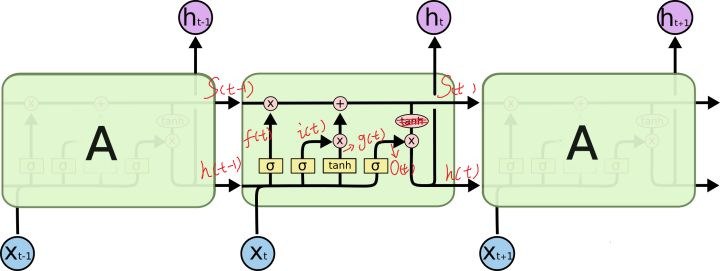

In [24]:
# 注意，以下代码都基于TensorFlow最新的1.2版本,而本notebook基于tensorflow1.0

import tensorflow as tf
import numpy as np
# cell = tf.contrib.rnn.BasicRNNCell(num_units=128) # rnn_size 即是 num_units
cell = tf.nn.rnn_cell.BasicRNNCell(num_units=128) # state_size = 128
print(cell.state_size) # 128

inputs = tf.placeholder(np.float32, shape=(32, 100)) # 32 是 batch_size
h0 = cell.zero_state(32, np.float32) # 通过zero_state得到一个全0的初始状态，形状为(batch_size, state_size)
output, h1 = cell.call(inputs, h0) #调用call函数

print(h1.shape) # (32, 128)

AttributeError: module 'tensorflow.python.ops.nn' has no attribute 'rnn_cell'